In [28]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [29]:
%autoreload 2

# GM0 Performance Evaluation

**IMPORTANT**: This notebook should be used as a base for the evaluation of different models. 

- Please **make a copy of this notebook** whenever you want to evaluate a model. Load the desired model by changing the following `model_path_str` variable. 
- This notebook is currently not saving any generated plot. Please make sure to not overwrite the outputs, or to save the plots whenever needed. 
- This notebook saves the generated data. Please refer to the Evaluation section of this notebook. 

Available models on the SDSC shared folder: 

In [ ]:
!ls /store/sdsc/sd28/models/GM0/diffusion/

1D-UNET-DDPM-envelope
consistency-model-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-pred:epsilon-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-pred:epsilon-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_LogSpectrogram-{}
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-first_order_lp-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-moving_average-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:2_LogSpectrogram-{}
ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-first_order_lp-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-dow

In [1]:
models_folder = "../outputs/"

One can either choose a specific checkpoint of a model or the most recent checkpoint of that model (default):

In [2]:
# Pick the last checkpoint of the model
#model_path_str = models_folder + "ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-scale:2-log-log_offset:1.0e-07-standardize-scalar:True"

# Or pick a specific checkpoint
model_path_str = models_folder + "ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-scale:2-log-log_offset:1.0e-07-normalize-scalar:True/name=0_epoch=186-val_loss=0.14.ckpt"

Import the needed libraries, modules and needed variables

In [3]:
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 150
mpl.rcParams['font.size'] = 13


import numpy as np
import torch
import os

from pathlib import Path
from tqdne.utils import *
from tqdne.conf import Config
from tqdne.metric import *

from tqdne.dataset import RepresentationDataset 
from torch.utils.data import DataLoader, ConcatDataset


/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [4]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    torch.cuda.empty_cache()
else: 
    device = torch.device('cpu')

torch.cuda.is_available(), device

(True, device(type='cuda'))

In [5]:
config = Config()

# Select the signal length
signal_length = config.signal_length 

# Set the sampling frequency
fs = config.fs

# Set the number of channels of the original waveforms  
n_channels = config.num_channels

# Set the conditioning parameters range
cond_params_range = config.conditional_params_range

Restore the sampling rate and signal length that were used during training

In [6]:
if "downsampling" in model_path_str:
    downsampling = int(model_path_str.split("downsampling:")[1].split("_")[0])
    signal_length = signal_length // downsampling
    fs = fs // downsampling
    config.signal_length = signal_length
    config.fs = fs
    print(f"Updated signal length: {config.signal_length} and fs: {config.fs}")
else:
    downsampling = 1    

Updated signal length: 2750 and fs: 50


Load the model

/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'net' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['net'])`.


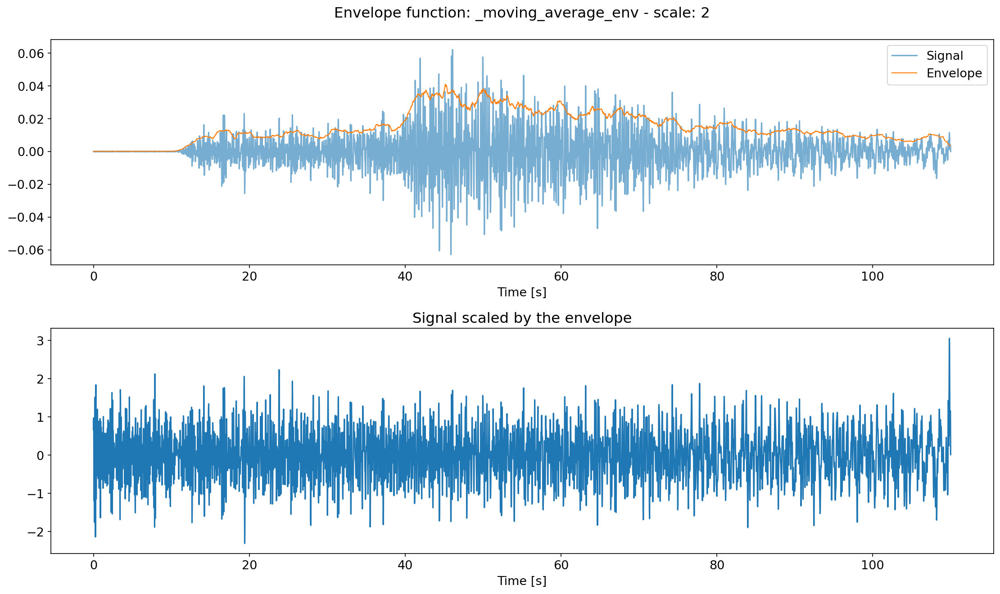

Model: LightningDiffusion
Number of learnable parameters: 9720070
Model size: 117.21 MB
UNet scheme: 
 base num. channels: 32 
 channel multipliers (down/up blocks): (1, 2, 4, 8) 
 num. ResBlocks per down/up block: 2 
 use Attention: True 
 conv. kernel size: 5 
Diffusion prediction type: sample
Learning rate schedule: 
 start: 0.0003 
 scheduler: cosine 
 warmup steps: 400
Batch size: 128
Downsampling factor: 2. The model was trained on signals with length 1375, as the sampling rate used was 25 instead of 50
Data representation shape: (1, 6, 1375) - (batch_size, channels, signal_length)
Data representation name: SignalWithEnvelope
Checkpoint: ../outputs/ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-scale:2-log-log_offset:1.0e-07-normalize-scalar:True/name=0_epoch=186-val_loss=0.14.ckpt - Last modified: 2024-07-12 13:27


In [7]:
model, model_data_repr, ckpt = load_model(Path(model_path_str), signal_length=signal_length, device=device)

Let's generate a batch of data

In [8]:
# Select the batch size.
batch_size = model.hparams.optimizer_params.batch_size

# One can also choose the batch size
# batch_size = 32

batch_size = batch_size*3
batch_size

384

In [ ]:
# Insert values for the conditional input parameters.
# Please read generate_cond_inputs documentation (in utils.py) to understand the structure of cond_input_params dictionary
cond_input_params = {
    "hypocentral_distance": [10, 50, 100, 150],
    "is_shallow_crustal": [0],
    "magnitude": [5.5, 4, 7, 8.8],
    "vs30": None,
}

data_raw = generate_data(model, model_data_representation=model_data_repr, raw_output=True, num_samples=batch_size, cond_input_params=cond_input_params, device=device.type)
data_raw['waveforms'].shape, data_raw['cond'].shape

Batch 1/3


100%|██████████| 100/100 [00:38<00:00,  2.57it/s]


Batch 2/3


 78%|███████▊  | 78/100 [00:18<00:05,  4.16it/s]

In [ ]:
data_raw_wf = data_raw['waveforms']
data_raw_wf.shape

In [ ]:
data_wf = model_data_repr.invert_representation(data_raw_wf)
data_wf.shape

## Single Sample Visualization

Let's investigate model's raw output 

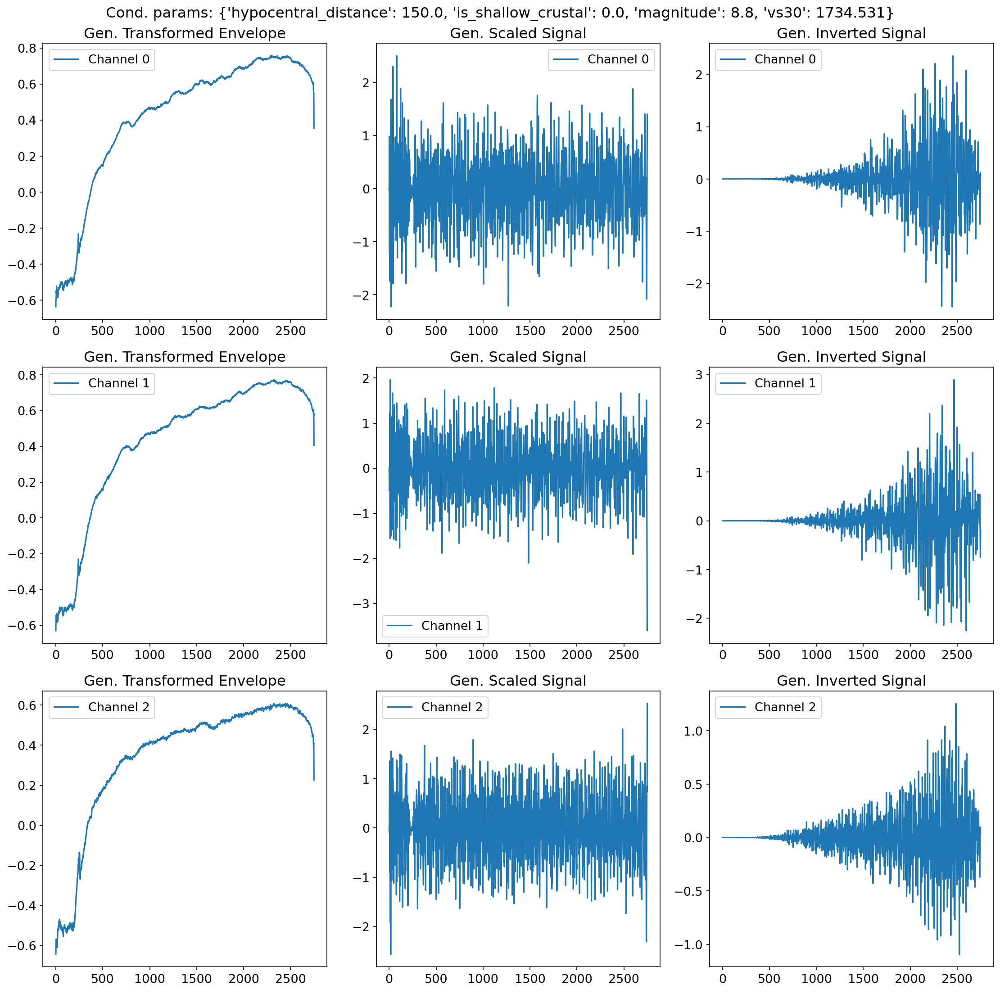

In [12]:
sample_index = 0
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

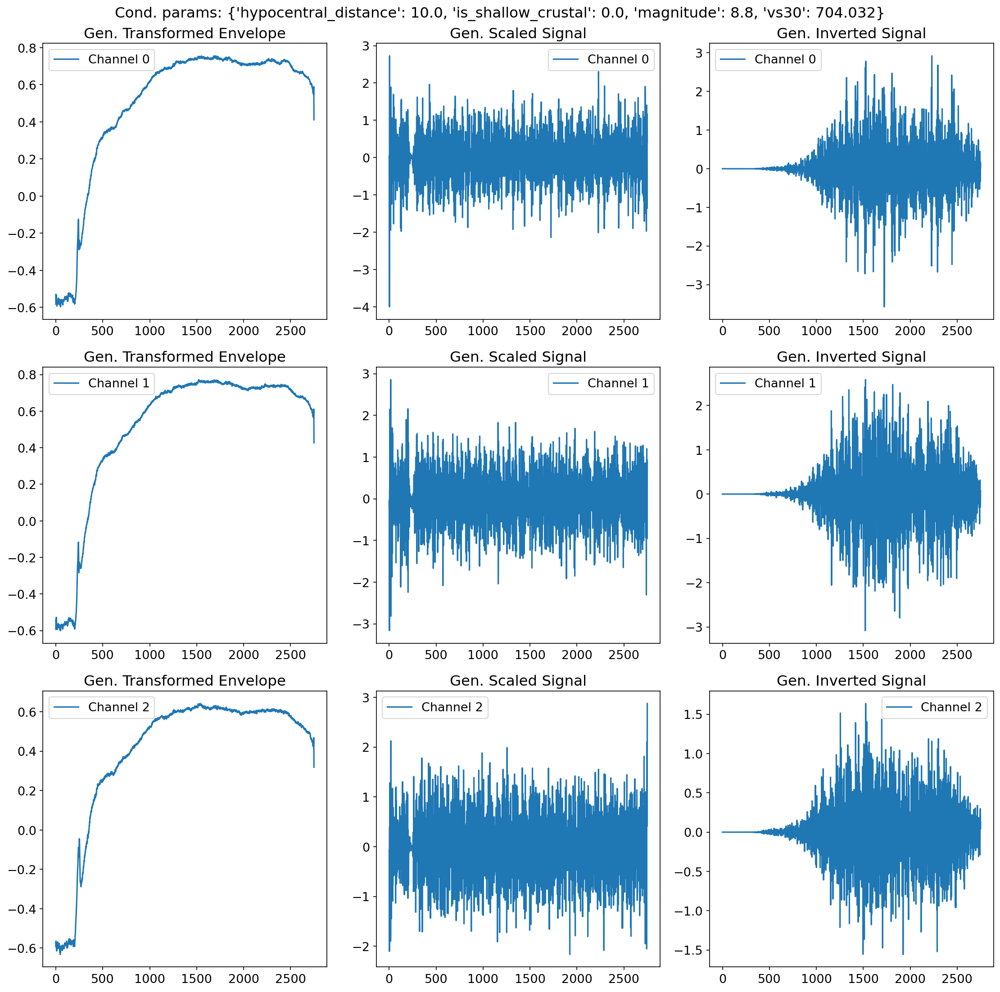

In [13]:
sample_index = 3
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

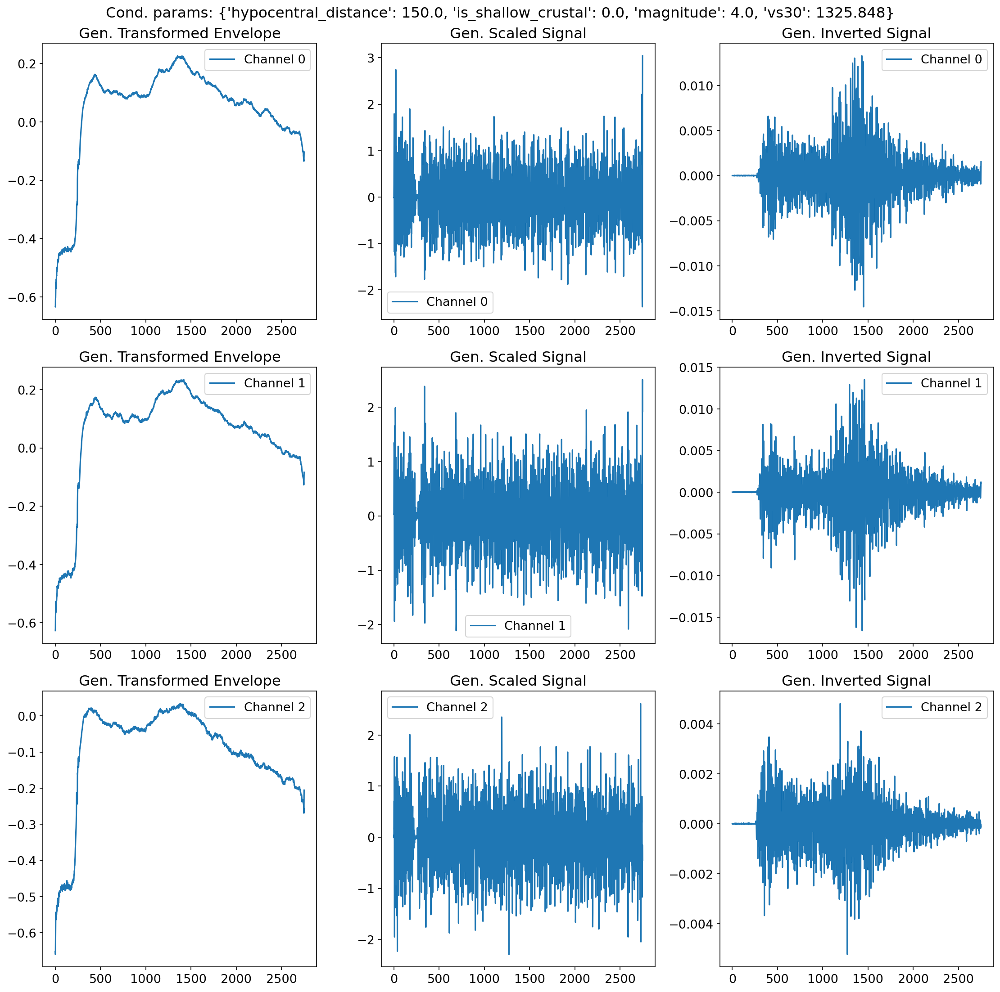

In [14]:
sample_index = -1
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

In [15]:
# TODO: works only for 1D signals, need to generalize to 2D signals. However, is only useful for 1D signals.
# max_peak_index = np.argmax(np.max(np.abs(data_raw_wf), axis=(1, 2)))
# plot_raw_waveform(data_raw_wf[max_peak_index], n_channels, data_wf[max_peak_index])

Let's now see the generated waveforms, along with their Power Spectral Density and Log Envelope. 

In [16]:
data = {"waveforms": data_wf, "cond": data_raw['cond']}

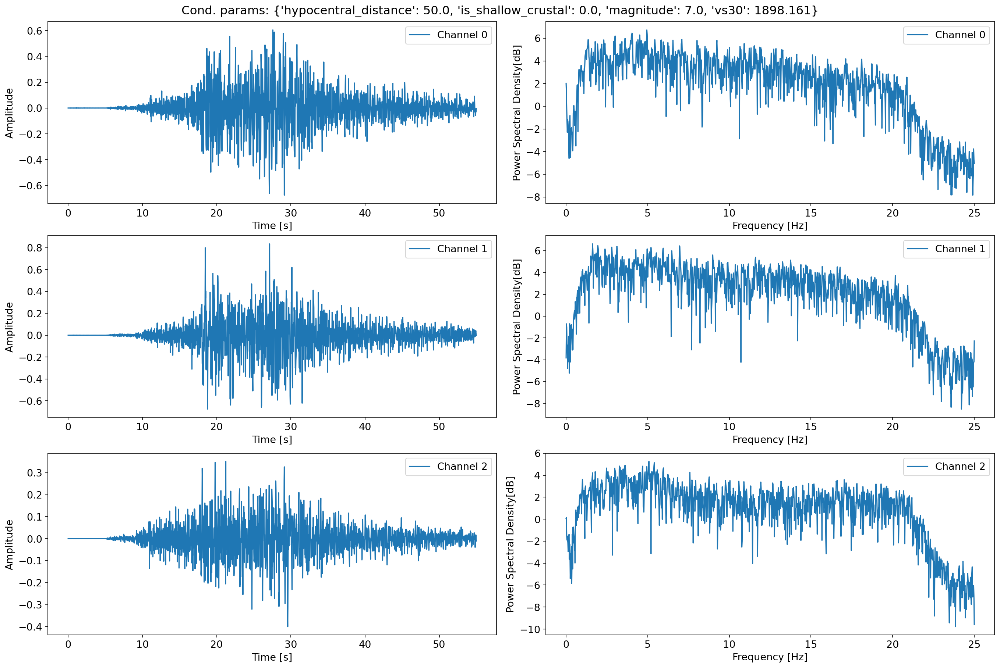

In [17]:
plot_waveform_and_psd(get_samples(data, num_samples=1))

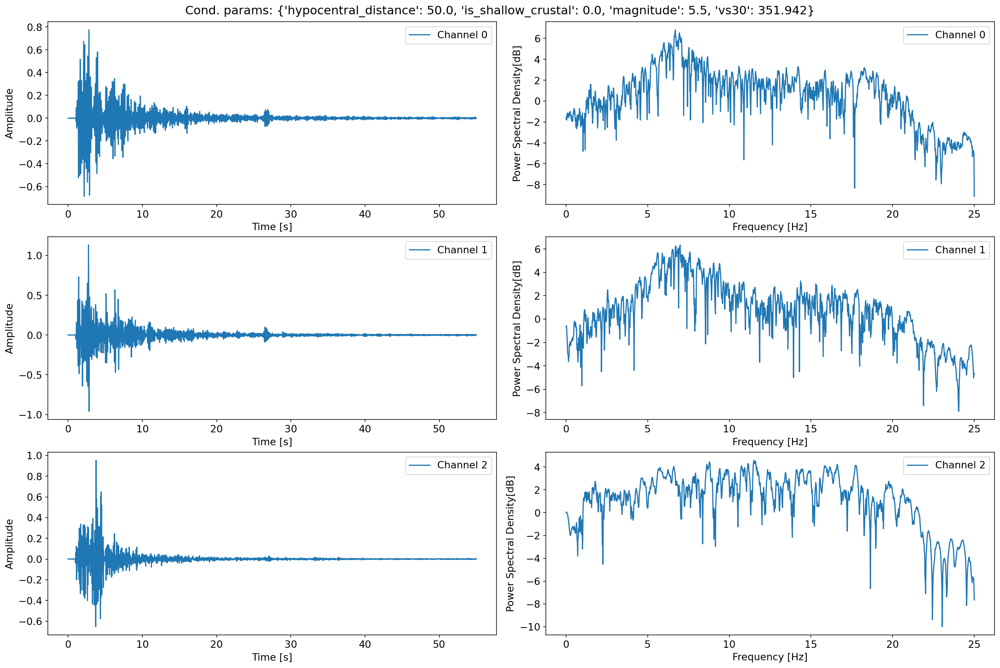

In [18]:
plot_waveform_and_psd(get_samples(data, indexes=[2]))

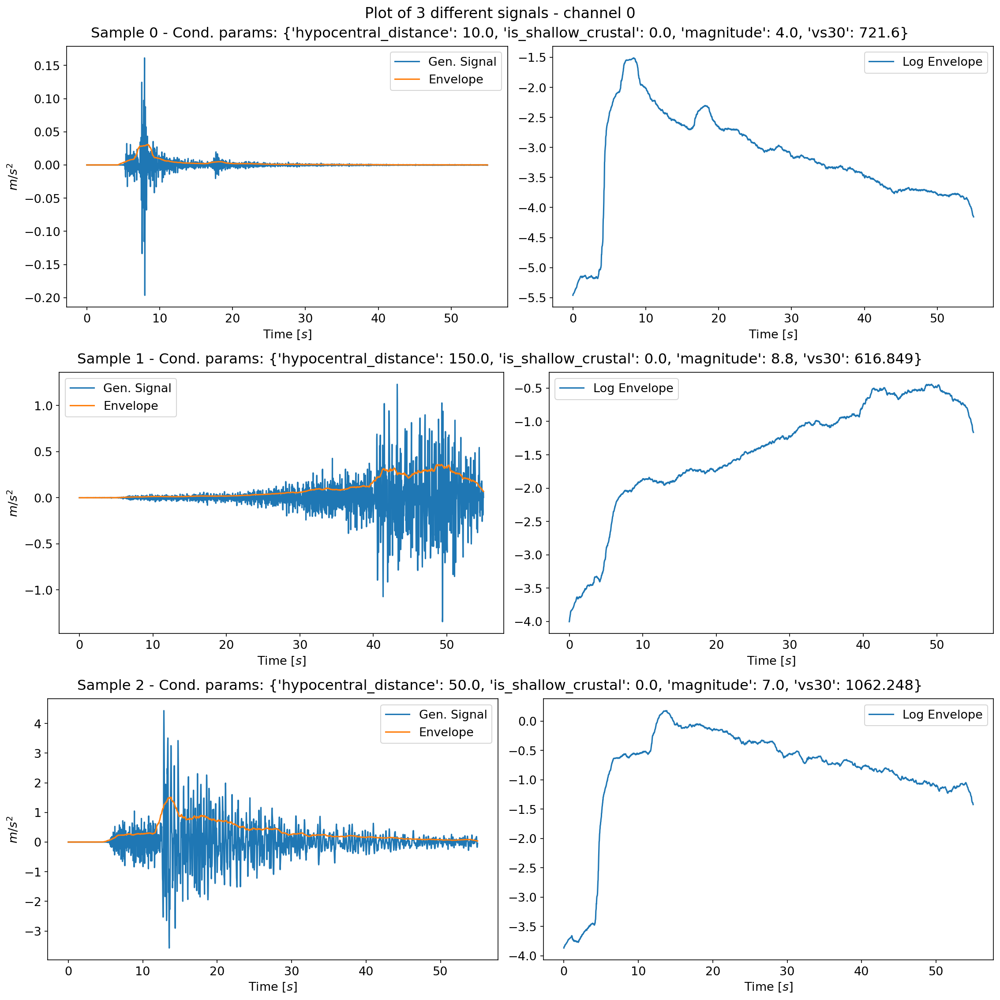

In [19]:
plot_waveforms(get_samples(data, num_samples=3), channel_index=0, plot_log_envelope=True)

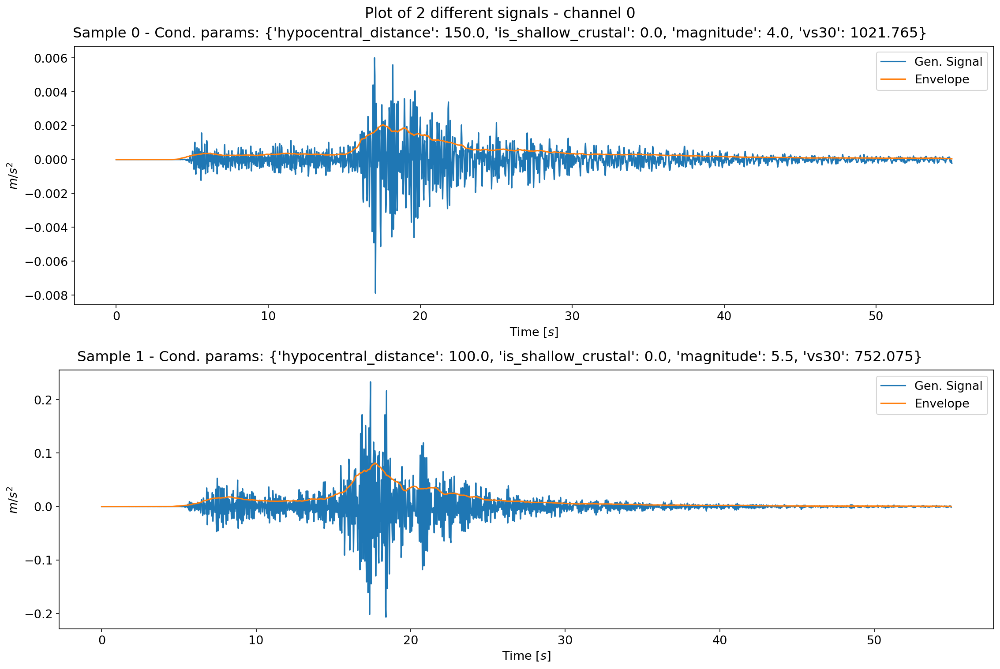

In [20]:
plot_waveforms(get_samples(data, num_samples=2), channel_index=0, plot_log_envelope=False)

## Batch Statistics

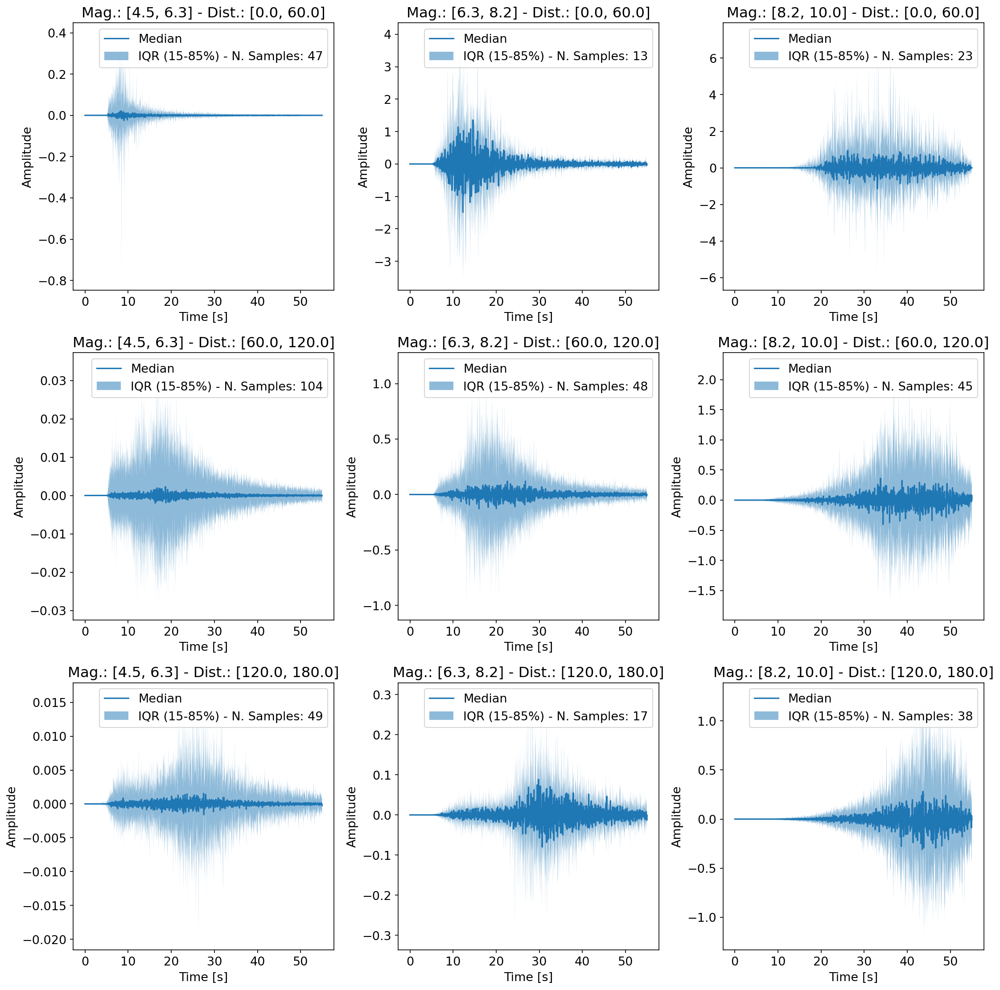

In [21]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='waveform')

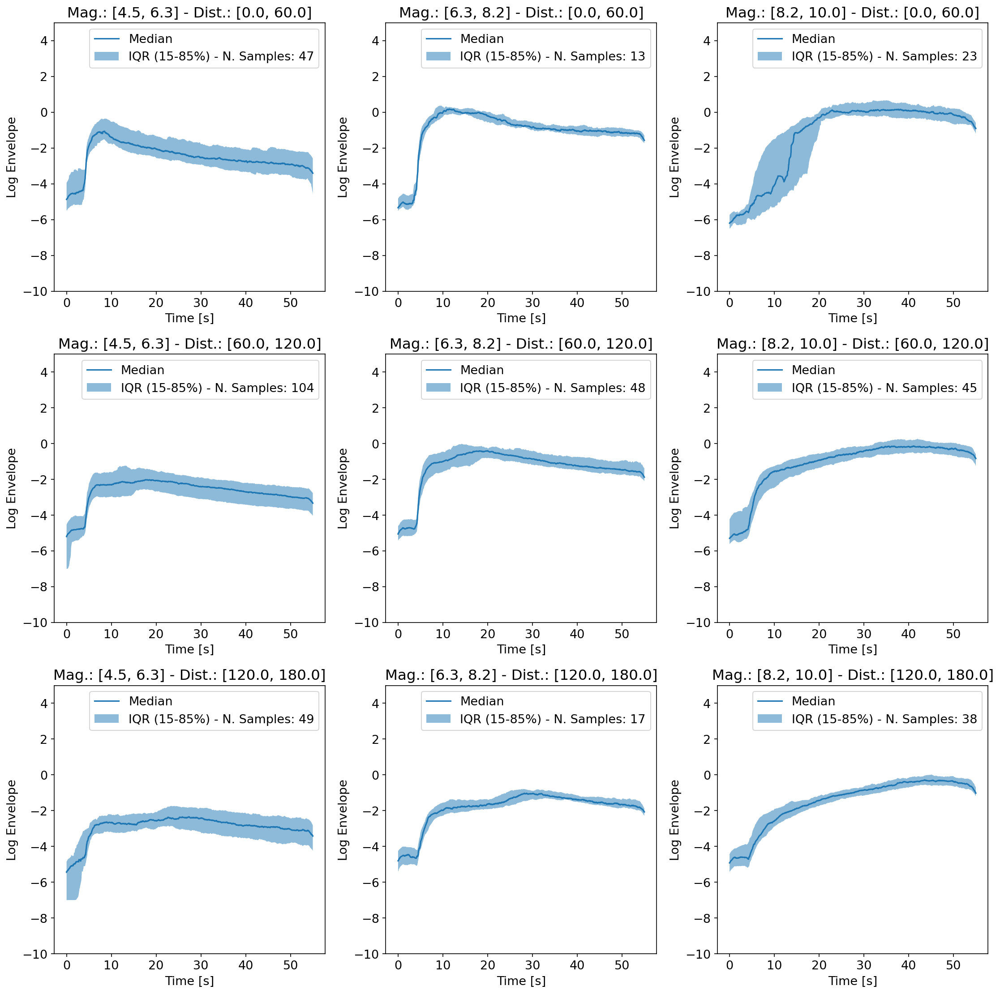

In [22]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='log_envelope')

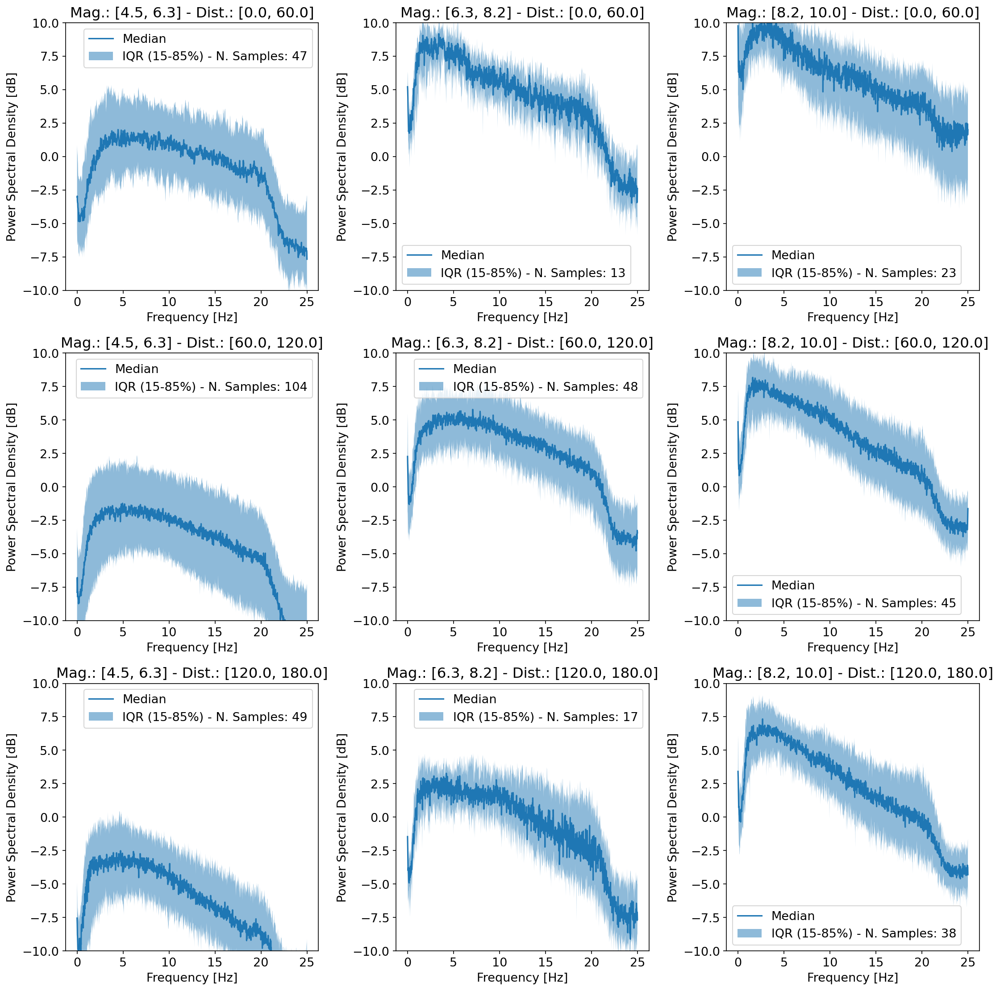

In [23]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='power_spectral_density')

In [24]:
del data
del data_raw

## Evaluation

In [11]:
from tqdne.representations import Signal

test_dataset_path = config.datasetdir / config.data_test
train_dataset_path = config.datasetdir / config.data_train

test_dataset = RepresentationDataset(test_dataset_path, Signal(), pad=config.signal_length*downsampling, downsample=downsampling)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
train_dataset = RepresentationDataset(train_dataset_path, Signal(), pad=config.signal_length*downsampling, downsample=downsampling)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

real_dataset = ConcatDataset([train_dataset, test_dataset])
real_dataloader = DataLoader(real_dataset, batch_size=batch_size, shuffle=False)

Let's generate couple of samples with the same conditioning parameters to check the expressiveness of the model and check if it lies within the true data distribution. 

Batch 1/1


100%|██████████| 100/100 [00:16<00:00,  6.23it/s]


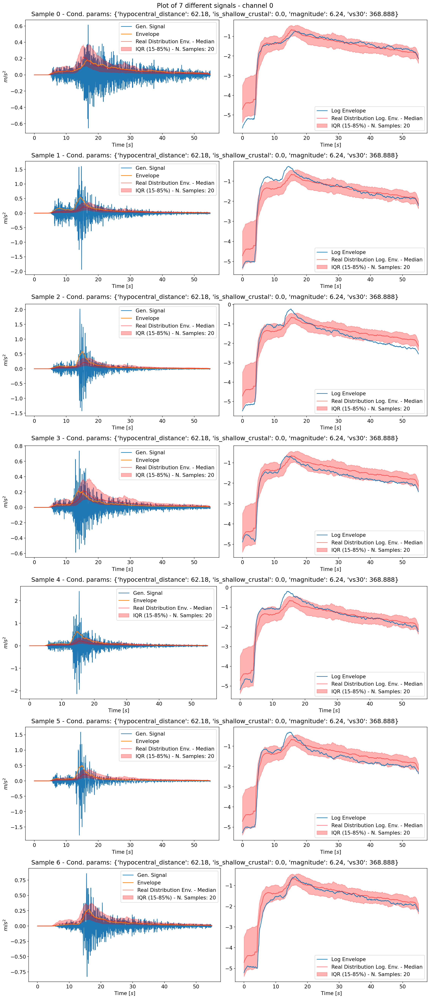

In [10]:
mag_bin = (6, 6.5)
dist_bin = (50, 70)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_test_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveform'])

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 40.69it/s]


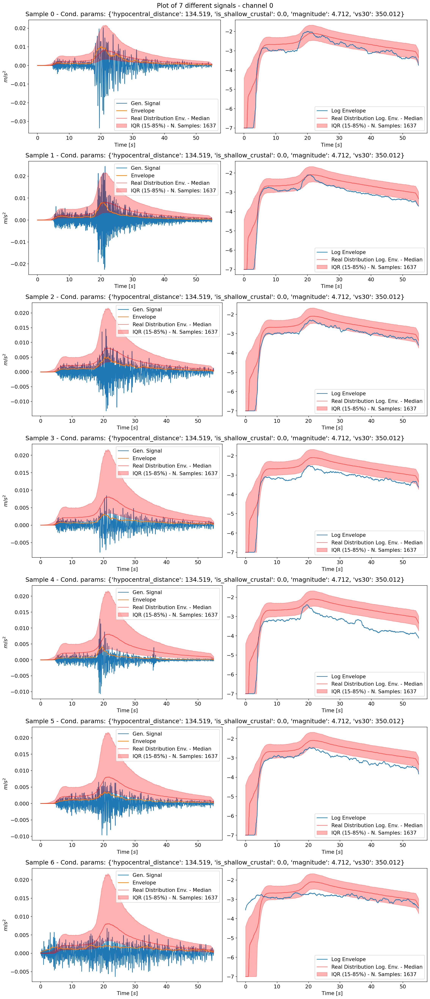

In [11]:
mag_bin = (4, 5)
dist_bin = (120, 150)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_test_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveform'])

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 41.03it/s]


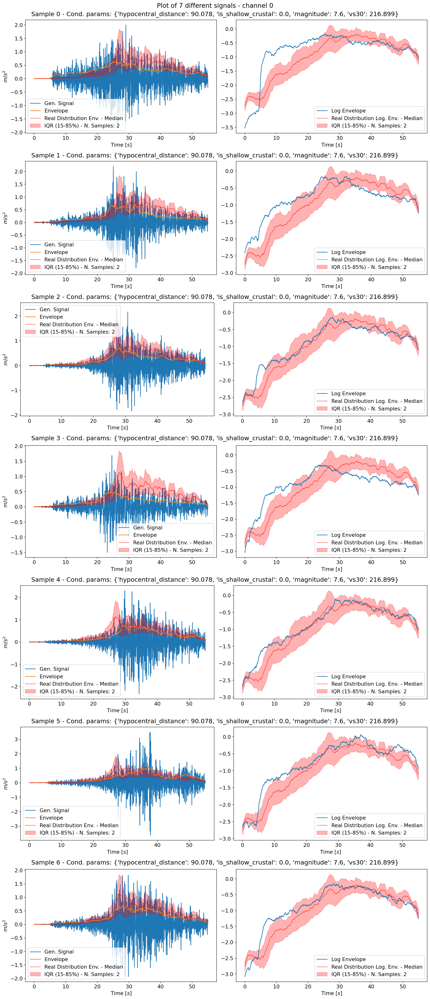

In [18]:
mag_bin = (7.5, 9.)
dist_bin = (80, 120)
data_real_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_real_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_real_single_bin['waveform'])

Let's now compare the statistics of the generated data wrt the real data.

In [12]:
real_data = {
    "waveforms": np.concatenate([test_dataset[:]['waveform'], train_dataset[:]['waveform']], axis=0),
    "cond": np.concatenate([test_dataset[:]['cond'], train_dataset[:]['cond']], axis=0)
}
real_data['waveforms'].shape, real_data['cond'].shape

((197370, 3, 2750), (197370, 4))

Now let's generate more samples to perform an analysis by dividing the data in bins (magnitude and distance). 

Let's save the generated data future use.

The data will be saved as a `dict` with keys `waveforms` and `cond` in the same place of the checkpoint of the selected model, with the same name of `ckpt`, except for the extension of the file (saved as a HDF5 `.hdf5` file).
The optimal approach for downloading the generated dataset to a local storage location is to replace the string `hdf5_filename` with the desired filename, thus enabling the file to be stored in the current directory. This file may then be downloaded via the integrated visual interface of VSCode or JupyterLab. 


In [13]:
# Save the generated waveforms along with the conditioning parameters
hdf5_filename = f"{str(ckpt).replace('.ckpt', '_new-dataset.hdf5')}"
hdf5_filepath = Path(hdf5_filename)

In [ ]:
# Generate waveforms with the same conditioning parameters of the real data
generated_raw_data = generate_data(
    model, 
    model_data_repr, 
    raw_output=True, 
    num_samples=real_data['waveforms'].shape[0], 
    cond_input=real_data['cond'], 
    device=device.type, 
    batch_size=batch_size,
    save_path=hdf5_filepath
)

generated_raw_data['waveforms'].shape, generated_raw_data['cond'].shape

Batch 1/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 2/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 3/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 4/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 5/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 6/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 7/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 8/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 9/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 10/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 11/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 12/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 13/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 14/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 15/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 16/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 17/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 18/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 19/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 20/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 21/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 22/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 23/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 24/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 25/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 26/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 27/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 28/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 29/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 30/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 31/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 32/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 33/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 34/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 35/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 36/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 37/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 38/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 39/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 40/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 41/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 42/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 43/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 44/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 45/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 46/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 47/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 48/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 49/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 50/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 51/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 52/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 53/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 54/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 55/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 56/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 57/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 58/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 59/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 60/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 61/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 62/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 63/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 64/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 65/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 66/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 67/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 68/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 69/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 70/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 71/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 72/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 73/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 74/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 75/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 76/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 77/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 78/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 79/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 80/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 81/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 82/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 83/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 84/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 85/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 86/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 87/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 88/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 89/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 90/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 91/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 92/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 93/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 94/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 95/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 96/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 97/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 98/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 99/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 100/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 101/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 102/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 103/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 104/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 105/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 106/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 107/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 108/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 109/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 110/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 111/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 112/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 113/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 114/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 115/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 116/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 117/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 118/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 119/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 120/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 121/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 122/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 123/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 124/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 125/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 126/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 127/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 128/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 129/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 130/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 131/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 132/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 133/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 134/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 135/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 136/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 137/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 138/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 139/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 140/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 141/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 142/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 143/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 144/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 145/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 146/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 147/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 148/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 149/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 150/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 151/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 152/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 153/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 154/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 155/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 156/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 157/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 158/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 159/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 160/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 161/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 162/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 163/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 164/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 165/513


 31%|███       | 31/100 [00:20<00:47,  1.46it/s]

Let's check the raw outputs by comparing them statistically with real data in the representation domain. 

In [ ]:
plot_raw_output_distribution(generated_raw_data["waveforms"], real_dataset[:]['waveform'], model_data_repr)

In [14]:
# check if generated_data is available
if 'generated_raw_data' in locals():
    generated_data = {"waveforms": model_data_repr.invert_representation(generated_raw_data['waveforms']), "cond": generated_raw_data['cond']}
    del generated_raw_data
    # if samples are available in a preexisting file, append the new samples to generated_data
    if hdf5_filepath.exists():
        with h5py.File(hdf5_filepath, 'r') as f:
            generated_data = {k: np.concatenate([generated_data[k], f[k][:]], axis=0) for k in generated_data.keys()}
else:
    # load the file hdf5_filename
    with h5py.File(hdf5_filepath, 'r') as f:
        generated_data = {"waveforms": f['waveforms'][:], "cond": f['cond'][:]}

generated_data['waveforms'].shape, generated_data['cond'].shape

((198906, 3, 2750), (198906, 4))

And let's now compare the generated data against the real ones. 

In [15]:
distance_bins = [(0, 40), (40, 60), (60, 80), (80.0, 120.), (120., 150.), (150., 200.)]
magnitude_bins = [(4.5, 5.0), (5., 5.5), (5.5, 6.5), (6.5, 7.5)]

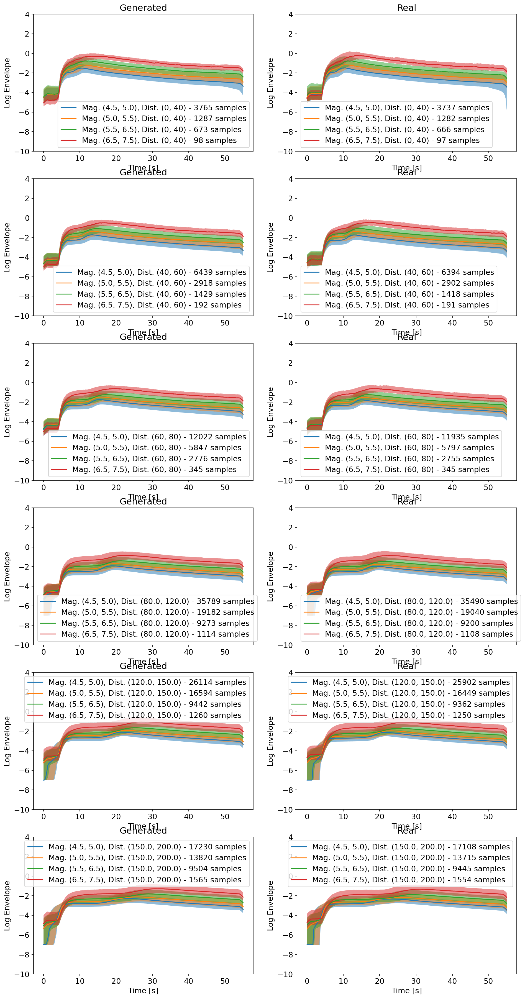

In [19]:
plot_bins(
    plot_type='log_envelope',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation = model_data_repr
)

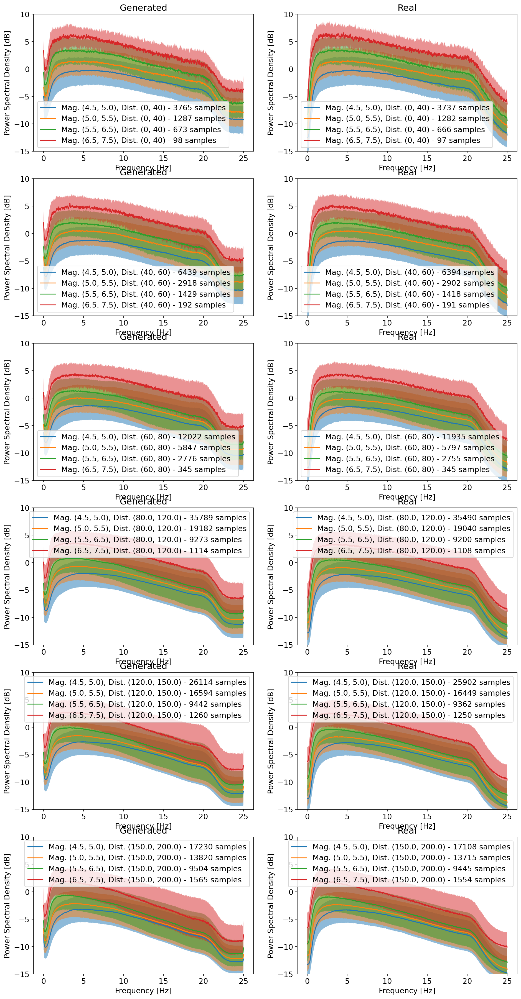

In [20]:
plot_bins(
    plot_type='power_spectral_density',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation=model_data_repr
)

### Evaluation using a classifier

In [12]:
classifier_path = Path("..outputs/classifier-2D-32Chan-(1, 2, 4, 8)Mult-2ResBlocks-4AttHeads_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=27-val_loss=0.92.ckpt")
classifier, classifier_data_repr, classifier_ckpt = load_model(classifier_path, use_ddim=False)
classifier_ckpt

/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


TypeError: LogSpectrogram.__init__() missing 1 required positional argument: 'output_signal_length'

#### Compute Fréchet Inception Distance (FID)

In [22]:
from tqdne.metric import compute_fid

fid_train_vs_test = compute_fid(
    classifier.get_embeddings(train_dataloader, classifier_data_repr), 
    classifier.get_embeddings(test_dataloader, classifier_data_repr)
)
print(f"FID baseline (train (N={len(train_dataset)}) vs test (N={len(test_dataset)})): {fid_train_vs_test}")


fid_real_vs_generated = compute_fid(
    classifier.get_embeddings(real_dataloader, classifier_data_repr), 
    classifier.get_embeddings(generated_data['waveforms'], classifier_data_repr)
)
print(f"FID (real (N={len(real_dataset)}) vs generated (N={generated_data['waveforms'].shape[0]})): {fid_real_vs_generated}")


100%|██████████| 39/39 [02:24<00:00,  3.70s/it]


FID baseline (train (N=182523) vs test (N=14847)): 0.0042953230629869665


100%|██████████| 256/256 [31:42<00:00,  7.43s/it]


FID (real (N=197370) vs generated (N=198906)): 8.335184018213813


#### Compute Inception Score

In [23]:
from tqdne.metric import compute_inception_score

print("Inception Score:", compute_inception_score(classifier.get_probabilities(generated_data['waveforms'], classifier_data_repr)))

100%|██████████| 256/256 [31:12<00:00,  7.31s/it]

Inception Score: 3.1721477288664


## TODOs

In [ ]:
# TODO: widgets do not work

# from tqdne.metric import PowerSpectralDensity, BinMetric
# import ipywidgets as widgets
# from functools import partial

# metrics = {"Power Spectral Density": partial(PowerSpectralDensity, fs=config.fs)}

# # Create a dropdown for selecting the metric
# metric_dropdown = widgets.Dropdown(
#     options=metrics.keys(),
#     description='Metric:',
# )

# # Create a slider for selecting the channel
# channel_slider = widgets.IntSlider(
#     value=0,
#     min=0,
#     max=2,
#     step=1,
#     description='Channel:',
#     disabled=False,
#     continuous_update=False,
#     orientation='horizontal',
#     readout=True,
#     readout_format='d'
# )


# # Bin plot checkbox
# bin_plot_checkbox = widgets.Checkbox(
#     value=False,
#     description='Plot bins',
#     disabled=False,
#     indent=True,
# )

# # Create a slider for selecting the number of bins
# num_bins_slider = widgets.IntSlider(
#     value=10,
#     min=1,
#     max=50,
#     step=1,
#     description='Num bins:',
#     disabled=False,
#     continuous_update=False,
#     orientation='horizontal',
#     readout=True,
#     readout_format='d'
# )

# # Function to update the plot
# def update_plot(metric_name, bin_plot, num_bins=10, channel=0):
#     metric = metrics[metric_name](channel=channel)
#     if bin_plot:
#         metric = BinMetric(metric, num_mag_bins=num_bins, num_dist_bins=num_bins)

#     # Compute the metric
#     metric.reset()
#     metric.update(pred={"generated": pred_waveforms}, target={"representation": test_waveforms[:, :, : pred_waveforms.shape[-1]], "cond": test_features})
#     metric.plot().show()

# # Create interactive plot
# widgets.interact(update_plot, metric_name=metric_dropdown, channel=channel_slider, bin_plot=bin_plot_checkbox, num_bins=num_bins_slider)



In [ ]:
print('done')

In [ ]:
# # Save the data to obspy format
# from obspy import Stream, Trace

# # Convert waveforms to Trace objects
# traces = [Trace(data=waveform, header={k:v for k, v in get_cond_params_dict(pred_data["cond"][i])}) for i, waveform in enumerate(pred_data["waveforms"])]

# # Create a Stream object
# st = Stream(traces=traces)

# # Save the Stream object to a file
# st.write("generated_waveforms.mseed", format="MSEED", reclen=512, encoding="FLOAT64")
